In [2]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from matplotlib.colors import LogNorm
from lonboard import Map, PolygonLayer
from lonboard.colormap import apply_categorical_cmap, apply_continuous_cmap
from palettable.colorbrewer.sequential import PuRd_9

In [3]:
data_pd = pd.read_csv("C:/Users/王小雅/1/cdp-mapping-systems/Data/Building_Elevation_and_Subgrade__BES__20240718.csv")

In [4]:
data_pd.columns

Index(['the_geom', 'bin', 'bbl', 'borough', 'block', 'lot', 'address',
       'z_grade', 'z_floor', 'subgrade', 'notes1', 'notes2', 'notes3', 'x',
       'y', 'latitude', 'longitude', 'pluto_bbl', 'Council', 'BoroCD',
       'CTLabel', 'BoroCT2020', 'NTA2020', 'NTAName', 'CDTA2020', 'CDTAName'],
      dtype='object')

In [5]:
data_pd.dtypes

the_geom       object
bin             int64
bbl             int64
borough       float64
block         float64
lot             int64
address        object
z_grade       float64
z_floor       float64
subgrade       object
notes1         object
notes2         object
notes3         object
x             float64
y             float64
latitude      float64
longitude     float64
pluto_bbl       int64
Council         int64
BoroCD          int64
CTLabel       float64
BoroCT2020      int64
NTA2020        object
NTAName        object
CDTA2020       object
CDTAName       object
dtype: object

In [6]:
data_pd.borough.value_counts()

borough
4.0    331103
3.0    273513
5.0    123614
2.0     88939
1.0     44706
Name: count, dtype: int64

In [7]:
data_pd.z_floor.value_counts()

z_floor
0.000      14038
33.240        29
28.761        26
30.659        26
35.178        25
           ...  
132.249        1
156.888        1
148.703        1
132.692        1
137.461        1
Name: count, Length: 159426, dtype: int64

In [8]:
data_pd.z_floor.describe()

count    861876.000000
mean         58.113704
std          42.560673
min           0.000000
25%          27.438000
50%          48.370000
75%          77.063000
max         404.397000
Name: z_floor, dtype: float64

<Axes: ylabel='Frequency'>

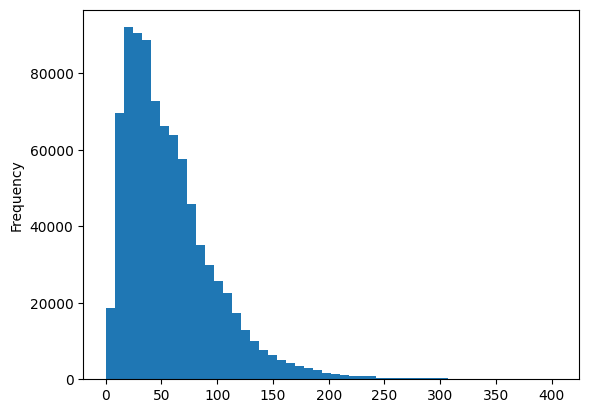

In [9]:
data_pd.z_floor.plot.hist(bins=50)

<Axes: ylabel='Frequency'>

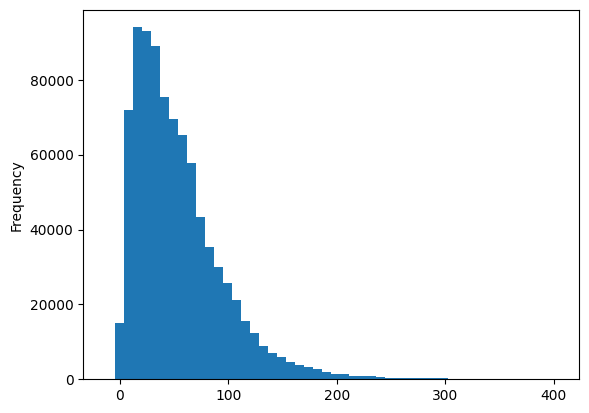

In [10]:
data_pd.z_grade.plot.hist(bins=50)

In [11]:
data_pd['borough'].unique()

array([ 5.,  3.,  4.,  1.,  2., nan])

In [12]:
data_pd['the_geom'].unique()

array(['POINT (-74.22274561187417 40.52134422844183)',
       'POINT (-74.24179250549321 40.52875316810818)',
       'POINT (-74.24109012652094 40.528883822921635)', ...,
       'POINT (-73.8359093002875 40.8786085841851)',
       'POINT (-73.83056080435648 40.889656359433204)',
       'POINT (-73.82673255537071 40.886862069131475)'], dtype=object)

In [13]:
data_pd[data_pd.the_geom.isna()]

,the_geom,bin,bbl,borough,block,lot,address,z_grade,z_floor,subgrade,...,longitude,pluto_bbl,Council,BoroCD,CTLabel,BoroCT2020,NTA2020,NTAName,CDTA2020,CDTAName


In [14]:
data_pd['borough'] = data_pd['borough'].fillna("Unknown")

In [15]:
data_pd[data_pd.borough.isna()]

,the_geom,bin,bbl,borough,block,lot,address,z_grade,z_floor,subgrade,...,longitude,pluto_bbl,Council,BoroCD,CTLabel,BoroCT2020,NTA2020,NTAName,CDTA2020,CDTAName


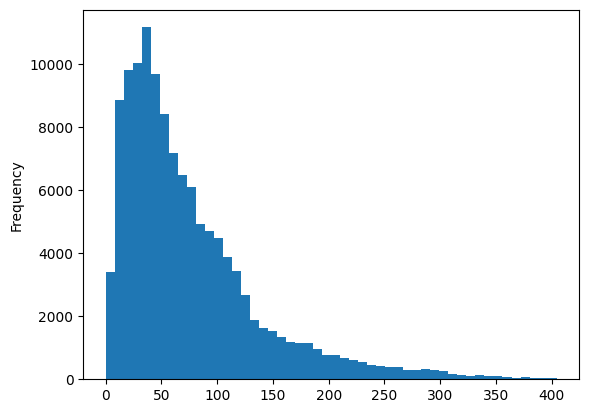

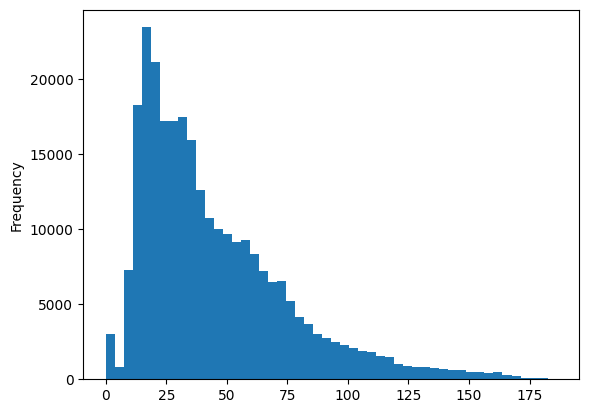

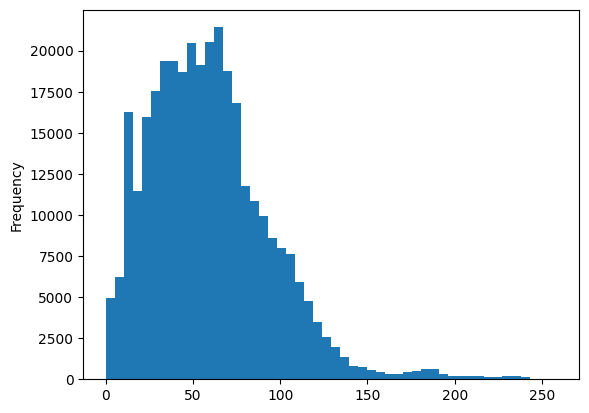

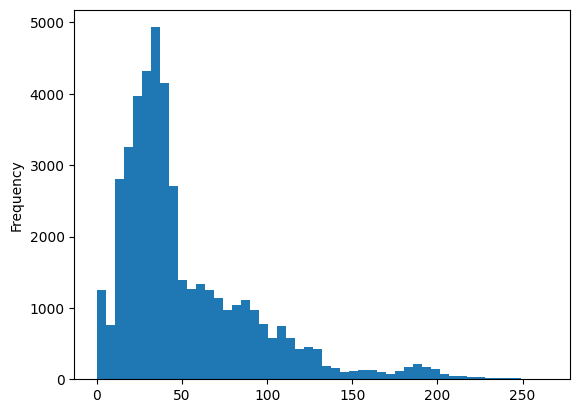

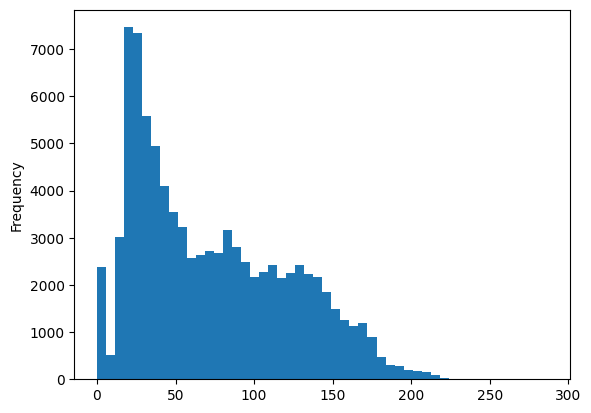

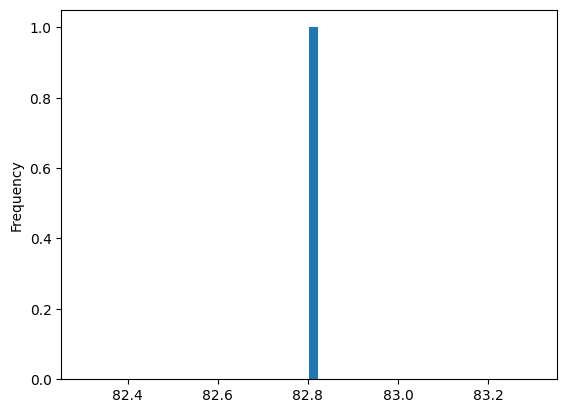

In [16]:
for borough in data_pd['borough'].unique():
    plt.figure()  # Create a new figure for each borough
    data_pd[data_pd['borough'] == borough]['z_floor'].plot.hist(bins=50)

In [17]:
data_pd.the_geom.value_counts()

the_geom
POINT (-73.82673255537071 40.886862069131475)    1
POINT (-74.22274561187417 40.52134422844183)     1
POINT (-74.24179250549321 40.52875316810818)     1
POINT (-74.24109012652094 40.528883822921635)    1
POINT (-73.80287620234908 40.852635302635676)    1
                                                ..
POINT (-74.23891433033549 40.503620363763616)    1
POINT (-74.23580075084969 40.51396803202499)     1
POINT (-74.22512005320297 40.511281858819736)    1
POINT (-74.23813052508946 40.50848209213956)     1
POINT (-74.24198032271697 40.51005666426356)     1
Name: count, Length: 861876, dtype: int64

In [18]:
data_pd.the_geom.describe()

count                                            861876
unique                                           861876
top       POINT (-73.82673255537071 40.886862069131475)
freq                                                  1
Name: the_geom, dtype: object

In [19]:
data_pd.z_floor.sum()

np.float64(50086806.70399999)

Text(0.5, 1.0, 'Total z_floor by borough type')

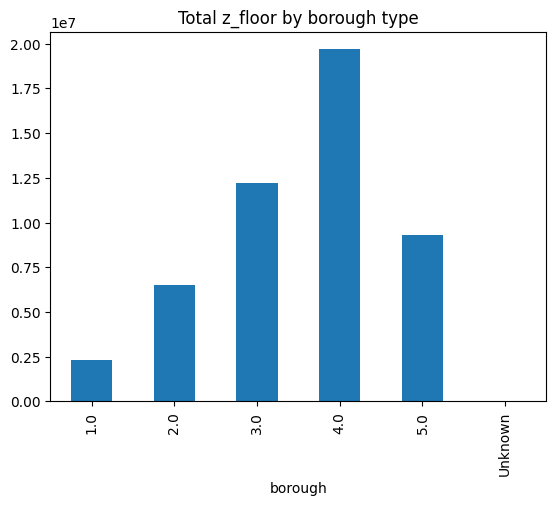

In [20]:
data_pd.groupby("borough").z_floor.sum().plot.bar()
plt.title("Total z_floor by borough type")

Text(0.5, 1.0, 'Average z_floor by borough Type')

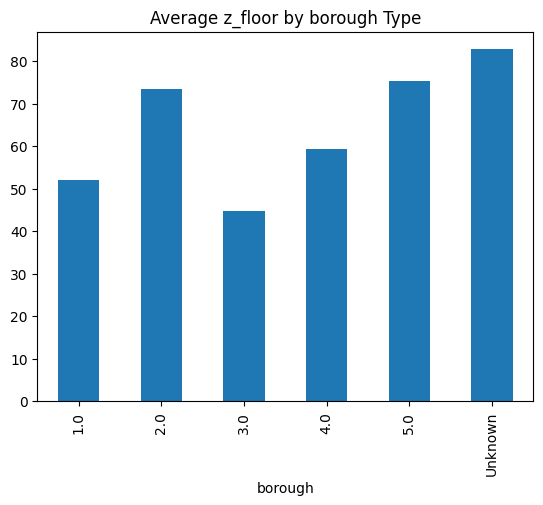

In [21]:
avr_z_floor=data_pd.groupby("borough")['z_floor'].mean()
avr_z_floor.plot.bar()
plt.title('Average z_floor by borough Type')

In [22]:
data_pd.address.describe()

count               844875
unique              796756
top       FINGERBOARD ROAD
freq                   423
Name: address, dtype: object

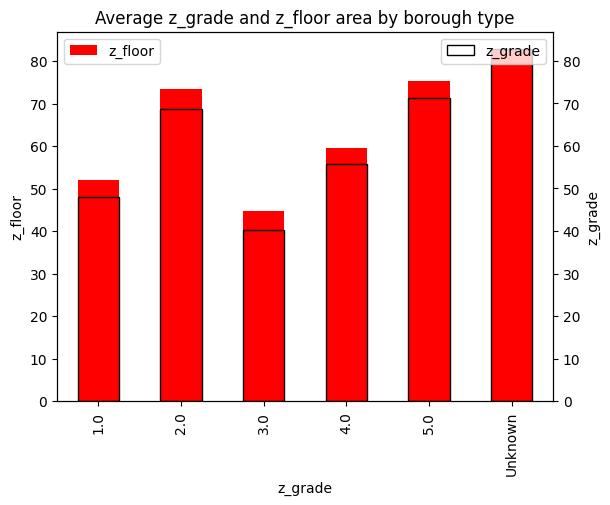

In [23]:
# plot both lot and building area on the same plot with a secondary y-axis
fig, ax = plt.subplots()
by_z_floor = data_pd.groupby("borough").z_floor.mean()
by_z_floor.plot.bar(ax=ax, color="red")

# get order to apply below
order = {v: i for i, v in enumerate(by_z_floor.index)}

ax.set_ylabel("z_floor")
ax.set_xlabel("z_grade")

ax2 = ax.twinx()
data_pd.groupby("borough").z_grade.mean().reindex(by_z_floor.index).plot.bar(
    ax=ax2, edgecolor="black", color="none"
)
ax2.set_ylabel("z_grade")

plt.title("Average z_grade and z_floor area by borough type")

# add legends
ax.legend(["z_floor"], loc="upper left")
ax2.legend(["z_grade"], loc="upper right")

<Axes: title={'center': 'z_floor'}, xlabel='borough'>

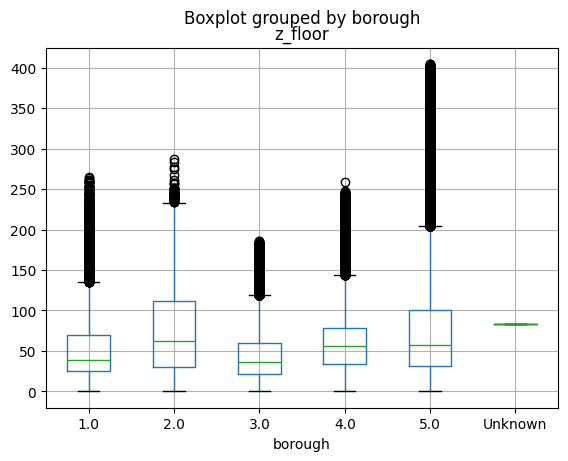

In [24]:
data_pd.boxplot(column="z_floor", by="borough")

<Axes: title={'center': 'z_grade'}, xlabel='borough'>

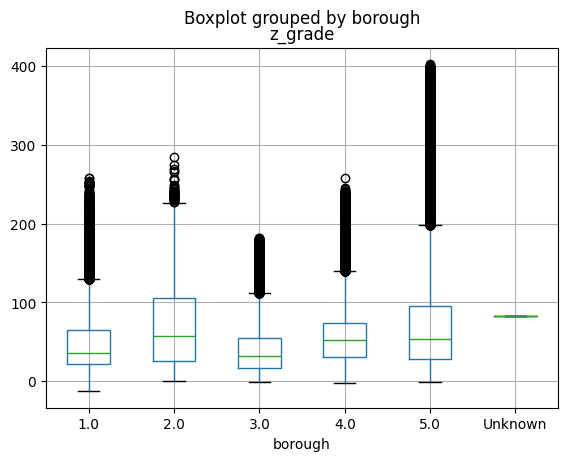

In [25]:
data_pd.boxplot(column="z_grade", by="borough")

<Axes: >

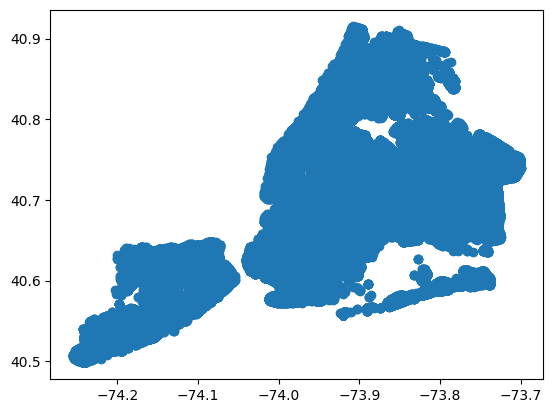

In [26]:
from shapely.geometry import Point

geometry = [Point(xy) for xy in zip(data_pd['longitude'], data_pd['latitude'])]
gdf = gpd.GeoDataFrame(data_pd, geometry=geometry)
gdf.plot()

<Axes: >

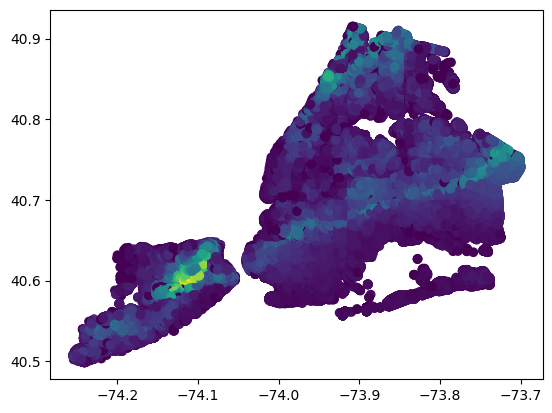

In [27]:
gdf.plot(column='z_floor')

<Axes: >

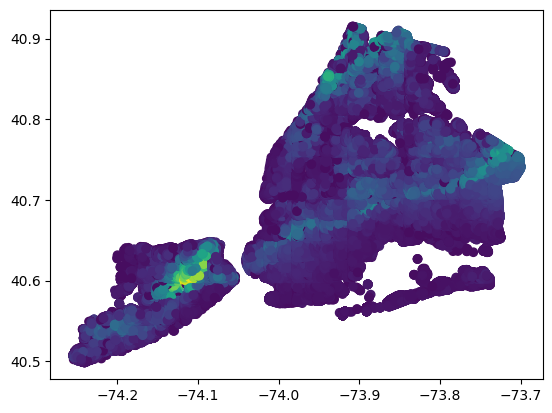

In [28]:
gdf.plot(column="z_grade")

In [29]:
data_pd.longitude.describe()

count    861876.000000
mean        -73.920238
std           0.118567
min         -74.255266
25%         -73.981596
50%         -73.910686
75%         -73.834218
max         -73.700369
Name: longitude, dtype: float64

In [30]:
COLOR = [
    [240, 249, 232],
    [204, 235, 197],
    [168, 220, 184],
    [123, 204, 196],
    [78, 179, 211],
    [43, 140, 190],
    [8, 104, 172],
    [8, 64, 129]
]

In [35]:
geometry = [Point(xy) for xy in zip(data_pd['longitude'], data_pd['latitude'])]
gdf = gpd.GeoDataFrame(data_pd, geometry=geometry)

min_lat = 40.8
max_lat = 40.82
min_lon = -74.1
max_lon = -73.9

selected_points = gdf[(gdf['latitude'] >= min_lat) & (gdf['latitude'] <= max_lat) &
                (gdf['longitude'] >= min_lon) & (gdf['longitude'] <= max_lon)]

print(selected_points)

                                             the_geom      bin         bbl  \
2755    POINT (-73.94487656293961 40.809825413524884)  1076640  1019120139   
2794     POINT (-73.94239484561282 40.80876251666104)  1087373  1017257501   
3059     POINT (-73.91068314388606 40.81973824524924)  2096576  2023607501   
548615   POINT (-73.95242355545665 40.80915942495237)  1059293  1019500129   
548792   POINT (-73.94566240072322 40.80302652828338)  1090594  1017180030   
...                                               ...      ...         ...   
683529    POINT (-73.90612777075299 40.8198040666622)  2004591  2026470102   
683536   POINT (-73.90246140168536 40.81418749565118)  2089921  2026840119   
683546   POINT (-73.90304744011632 40.81705310898124)  2004959  2026750054   
683571  POINT (-73.90809902764715 40.814883176163015)  2125658  2026420114   
683595    POINT (-73.9029649397254 40.81272681967929)  2005085  2026830043   

       borough   block   lot                 address  z_grade  

In [36]:
df=pd.DataFrame(selected_points)

In [44]:
import folium
mymap = folium.Map(location=[df['latitude'].iloc[0], df['longitude'].iloc[0]], zoom_start=15, tiles='CartoDB.Positron')
for index, row in df.iterrows():
    folium.Circle(
        location=[row['latitude'], row['longitude']],
        radius=row['z_grade']/20,
        popup=f"Point {index+1}, z_grade={row['z_grade']}<br>borough={row['borough']}<br>z_floor={row['z_floor']}<br>latitude={row['latitude']}<br>longitude={row['longitude']}",
        color='crimson',
        fill=True,
        fill_color='crimson'
    ).add_to(mymap)
mymap